In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/728eca3c-29c9-4b9d-8a1e-e1ba345d96bc.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/cfd384b8-fd90-44f2-83b5-cfc8b9b7e6c1.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/ea4a4c3e-a987-444c-8e7c-86721522faf9.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/e80f64aa-fded-4e27-bf51-66adfd10fa7a.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/377a8061-d1b9-43ac-90d7-1251177ad998.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/a7b184c5-b1fb-47fe-a049-a5843b11a6b0.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/471aee5b-73c0-4078-b1a7-84456943c3f0.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/1a98e7b1-699e-402c-baee-eff1478a695e.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/319d5878-e6d9-45ec-9024-9f99aa8ae9f3.jpg
/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerData

In [2]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [3]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/fdata-adni-dataset')):
    subfolder_path = os.path.join('/kaggle/input/fdata-adni-dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


,image,label
0,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
1,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
2,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
3,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
4,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
...,...,...
33979,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33980,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33981,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33982,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN


Exact counts for each class:
label
EMCI    9600
LMCI    8960
AD      8960
CN      6464
Name: count, dtype: int64


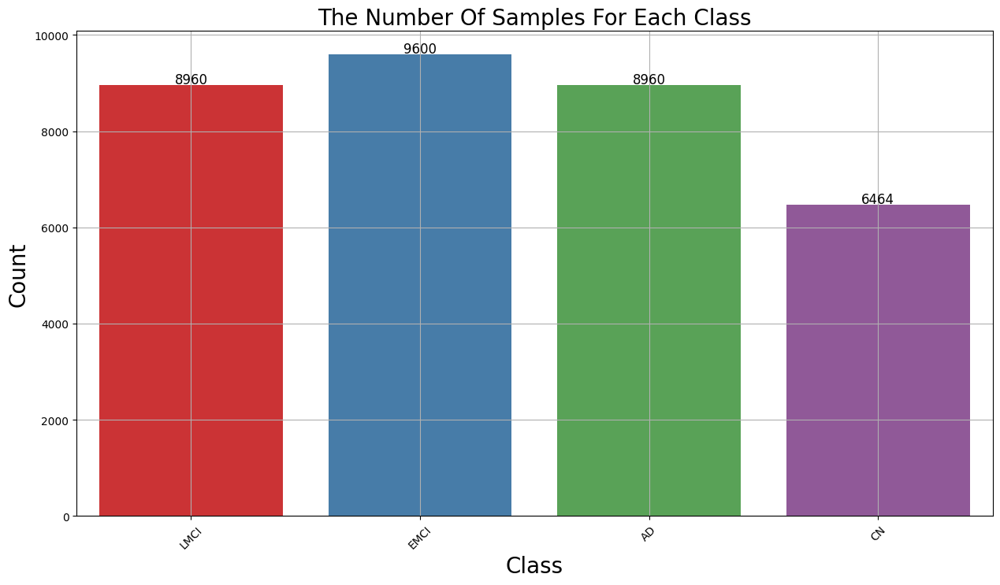

In [4]:
# Assuming `df` is your DataFrame and `label` is the column with class labels
class_counts = df['label'].value_counts()

# Print exact counts
print("Exact counts for each class:")
print(class_counts)

# Plot the class distribution
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['label'], palette='Set1')
ax.set_xlabel("Class", fontsize=20)
ax.set_ylabel("Count", fontsize=20)
plt.title('The Number Of Samples For Each Class', fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)

# Annotate each bar with the exact count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

plt.show()


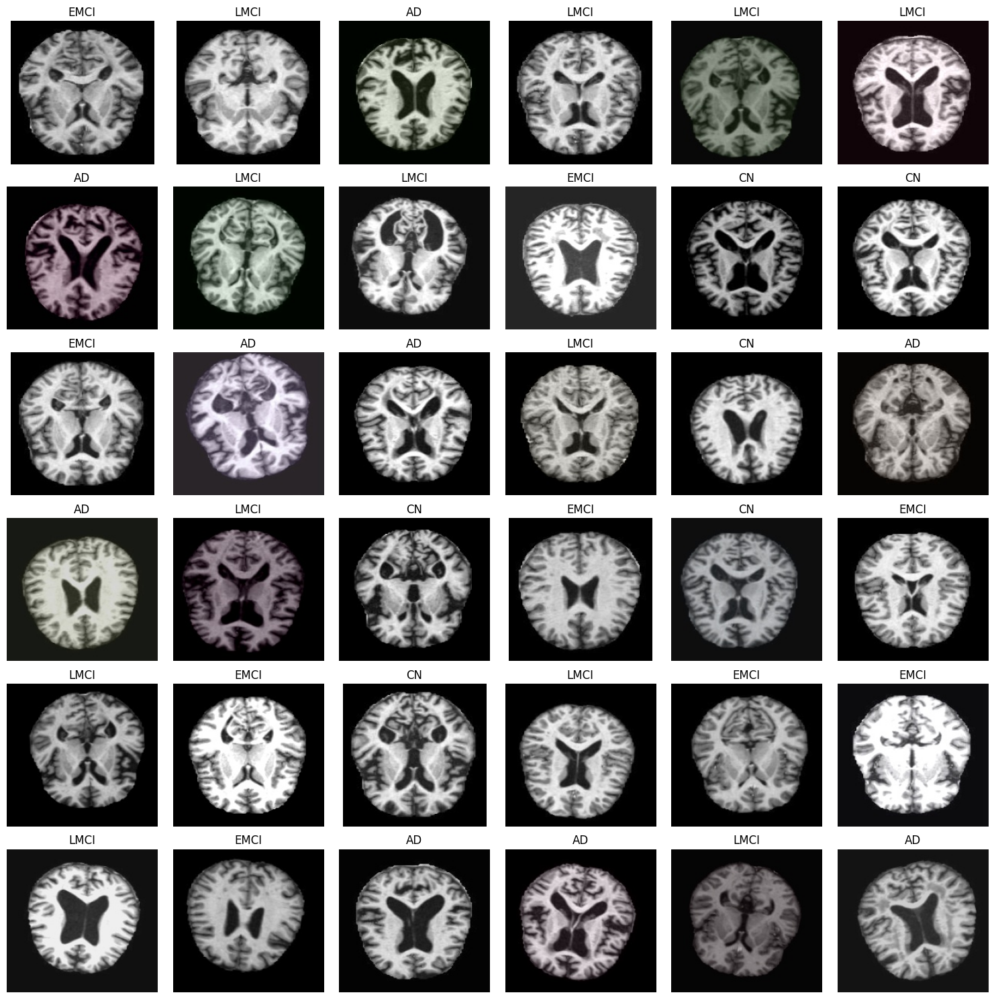

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

sample_df = df.sample(36).reset_index(drop=True)

plt.figure(figsize=(15, 15))

for i in range(36):
    plt.subplot(6, 6, i + 1)
    img = mpimg.imread(sample_df['image'][i])  
    plt.imshow(img)
    plt.title(sample_df['label'][i]) 
    plt.axis('off')  
plt.tight_layout()
plt.show()

In [7]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [8]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.vgg16.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    color_mode='rgb',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 27187 validated image filenames belonging to 4 classes.
Found 3399 validated image filenames belonging to 4 classes.
Found 3398 validated image filenames belonging to 4 classes.


In [9]:
class_num=list(train_generator.class_indices.keys())
class_num

['AD', 'CN', 'EMCI', 'LMCI']

In [10]:
import tensorflow as tf
from tensorflow.keras import layers, models

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.5),

    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    
    layers.Dense(4, activation='softmax')
])

model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 220, 220, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 220, 220, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 110, 110, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 110, 110, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 108, 108, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 108, 108, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 106, 106, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 106, 106, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 53, 53, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 51, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 51, 51, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 49, 49, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 49, 49, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 22, 22, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 22, 22, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 20, 20, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 7,764,900 (29.62 MB)

 Trainable params: 7,762,212 (29.61 MB)

 Non-trainable params: 2,688 (10.50 KB)

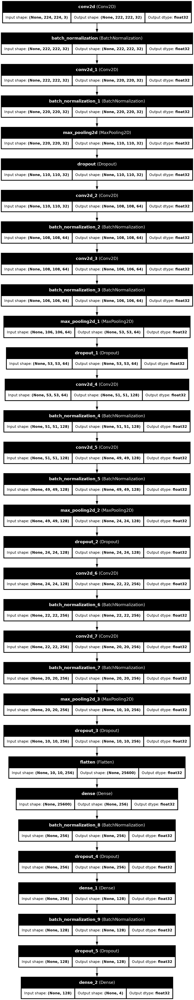

In [11]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [12]:
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[early_stopping_cb])

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1732668089.097120     105 service.cc:145] XLA service 0x7c75d0001ff0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732668089.097178     105 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1732668089.097184     105 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/850 ━━━━━━━━━━━━━━━━━━━━ 7:26:50 32s/step - accuracy: 0.1875 - loss: 2.6526

I0000 00:00:1732668113.439408     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


735/850 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - accuracy: 0.3857 - loss: 1.6425

2024-11-27 00:44:32.216128: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng4{k11=1} for conv (f32[19,32,222,222]{3,2,1,0}, u8[0]{0}) custom-call(f32[19,32,220,220]{3,2,1,0}, f32[32,32,3,3]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-27 00:44:32.238810: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.022811883s
Trying algorithm eng4{k11=1} for conv (f32[19,32,222,222]{3,2,1,0}, u8[0]{0}) custom-call(f32[19,32,220,220]{3,2,1,0}, f32[32,32,3,3]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config

850/850 ━━━━━━━━━━━━━━━━━━━━ 245s 251ms/step - accuracy: 0.3972 - loss: 1.5958 - val_accuracy: 0.5600 - val_loss: 0.9385
Epoch 2/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 144s 168ms/step - accuracy: 0.6207 - loss: 0.8396 - val_accuracy: 0.6207 - val_loss: 0.8564
Epoch 3/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 143s 168ms/step - accuracy: 0.6810 - loss: 0.7087 - val_accuracy: 0.7390 - val_loss: 0.6004
Epoch 4/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 143s 168ms/step - accuracy: 0.7286 - loss: 0.6196 - val_accuracy: 0.7884 - val_loss: 0.4927
Epoch 5/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 142s 167ms/step - accuracy: 0.7518 - loss: 0.5790 - val_accuracy: 0.7734 - val_loss: 0.5053
Epoch 6/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 144s 168ms/step - accuracy: 0.7693 - loss: 0.5484 - val_accuracy: 0.7610 - val_loss: 0.5662
Epoch 7/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 143s 167ms/step - accuracy: 0.8207 - loss: 0.4315 - val_accuracy: 0.8599 - val_loss: 0.3383
Epoch 8/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 143s 168ms/step - accuracy: 0.8453 - loss: 0.37

In [28]:
model.save('/kaggle/working/model_Cnn.keras')
model.export('/kaggle/working/model_Cnn')

Saved artifact at '/kaggle/working/model_Cnn'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  136847726074992: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726079216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726081152: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726083792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726081328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726081504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726329920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726331504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726333088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136847726334672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13684

In [13]:
loss,accuracy=model.evaluate(test_generator)
print("loss : ",loss)
print("accuracy : ",accuracy)

107/107 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - accuracy: 0.9853 - loss: 0.0480
loss :  0.04700237512588501
accuracy :  0.98470139503479


<Axes: >

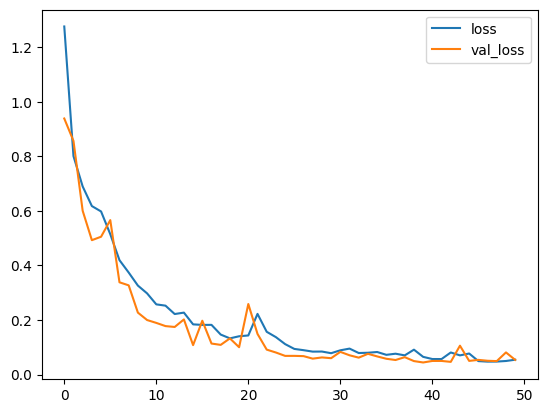

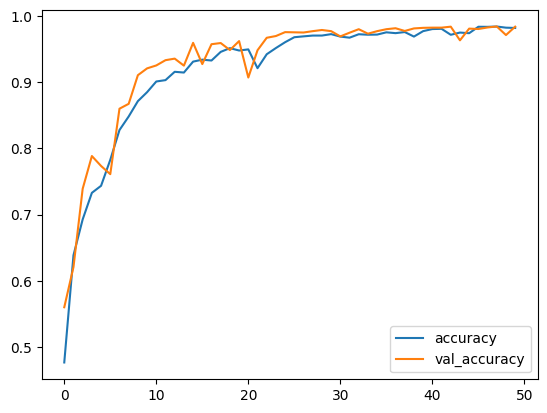

In [18]:
ef=pd.DataFrame(history.history)
ef[['loss','val_loss']].plot()
ef[['accuracy','val_accuracy']].plot()

In [15]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})

107/107 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step


In [19]:
df

,Actual,Prediction
0,2,2
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
3394,2,2
3395,1,1
3396,2,2
3397,2,2


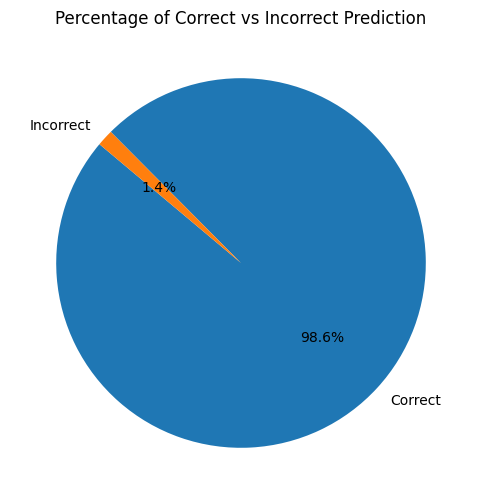

In [20]:
import matplotlib.pyplot as plt

correct_predictions = (y_test == y_pred).sum()
incorrect_predictions = (y_test != y_pred).sum()

labels = ['Correct', 'Incorrect']
sizes = [correct_predictions, incorrect_predictions]

plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Percentage of Correct vs Incorrect Prediction')
plt.show()

array([[893,   0,   1,   2],
       [  0, 647,   0,   0],
       [  1,   0, 936,  23],
       [  3,   1,  18, 874]])

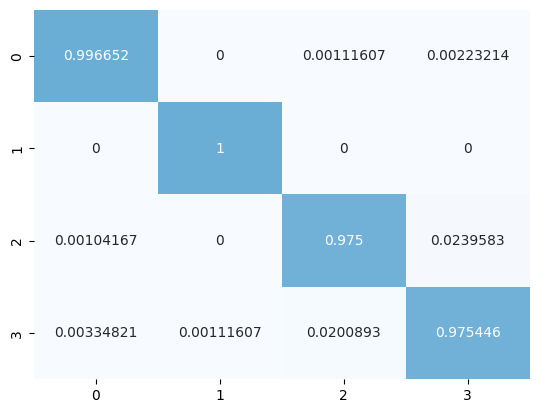

In [29]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues',xticklabels=class_num, yticklabels=class_num)
CM

In [24]:
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       896
           1       1.00      1.00      1.00       647
           2       0.98      0.97      0.98       960
           3       0.97      0.98      0.97       896

    accuracy                           0.99      3399
   macro avg       0.99      0.99      0.99      3399
weighted avg       0.99      0.99      0.99      3399

[[893   0   1   2]
 [  0 647   0   0]
 [  1   0 936  23]
 [  3   1  18 874]]


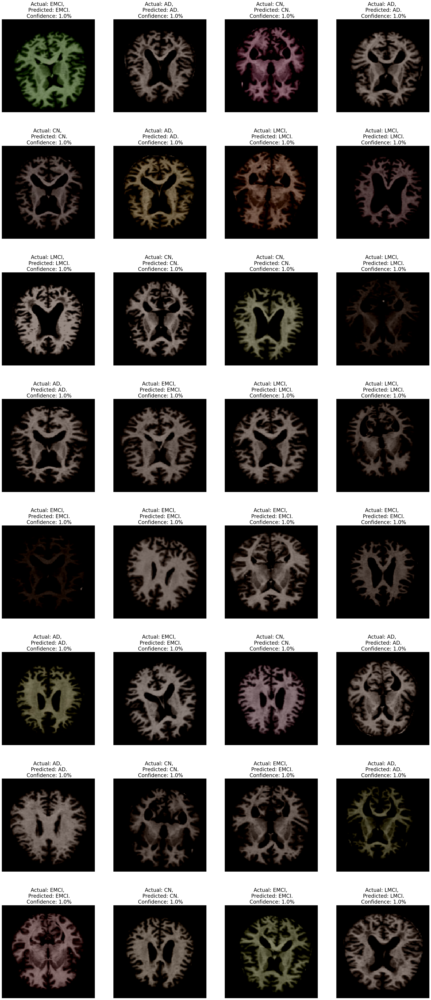

In [25]:
plt.figure(figsize=(30,70))
batch = next(test_generator)
images= batch[0]
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test[n]]}, \n Predicted: {class_num[y_pred[n]]}.\n Confidence: {round(predictions[n][np.argmax(predictions[n])],0)}%",fontsize=20)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


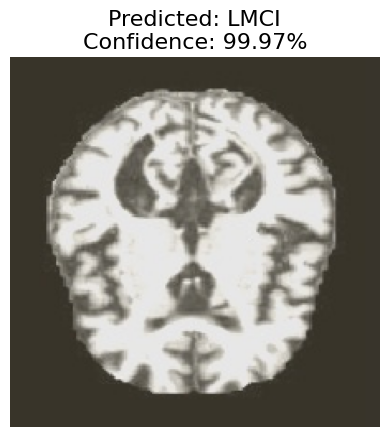

In [27]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

def predict_single_image(model, image_path, class_num, target_size=(224, 224)):
    """
    Predicts the class of a single image and displays it with the prediction and confidence.
    
    Args:
        model: Trained Keras model.
        image_path (str): Path to the image file.
        class_num (dict): Dictionary mapping class indices to class labels.
        target_size (tuple): Target size for resizing the image.
    """
    # Load and preprocess the image
    image = load_img(image_path, target_size=target_size)
    image_array = img_to_array(image)  # Convert to numpy array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize
    
    # Predict
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions)
    predicted_class_label = class_num[predicted_class_index]
    confidence = round(np.max(predictions) * 100, 2)
    
    # Display the image and prediction
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class_label}\nConfidence: {confidence}%", fontsize=16)
    plt.show()

# Example Usage
image_path = "/kaggle/input/fdata-adni-dataset/AugmentedAlzheimerDataset/LMCI/002149f6-8f25-4b27-9d7a-d059f3966676.jpg"
class_num = {0: 'AD', 1: 'CN', 2: 'EMCI', 3: 'LMCI'}
predict_single_image(model, image_path, class_num)